In [ ]:
import os
import json
import numpy as np
import cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras import layers


In [ ]:
!git clone https://github.com/pedropro/TACO.git

Cloning into 'TACO'...
remote: Enumerating objects: 740, done.
remote: Counting objects: 100% (435/435), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 740 (delta 416), reused 380 (delta 380), pack-reused 305 (from 1)
Receiving objects: 100% (740/740), 97.48 MiB | 14.50 MiB/s, done.
Resolving deltas: 100% (499/499), done.


In [ ]:
%cd TACO
! python download.py
%cd ..

/content/TACO
Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished
/content


In [ ]:
annotation_file='/content/TACO/data/annotations.json'
data_dir='/content/TACO/data'

In [ ]:
def load_taco_annotations(annotation_file):
    """
    Load TACO dataset annotations from JSON.
    """
    with open(annotation_file, 'r') as f:
        data = json.load(f)
    return data

In [ ]:
data = load_taco_annotations(annotation_file)


This code loads and displays images from the TACO (Trash Annotations in Context) dataset, with bounding boxes drawn around specific categories of waste items, such as "Plastic film," "Clear plastic bottle," and "Drink can." It first loads the dataset annotations and filters them to include only the categories specified in the desired_categories dictionary. For each of the first five images, it loads the image, resizes it to a target size (default 224x224), and draws bounding boxes around the waste items based on the annotations. Each bounding box is labeled with its category, and the image is displayed using Matplotlib. The bounding boxes and labels are scaled according to the resized image dimensions. The function visualizes the images with bounding boxes for a quick inspection of the dataset's content related to specific categories.

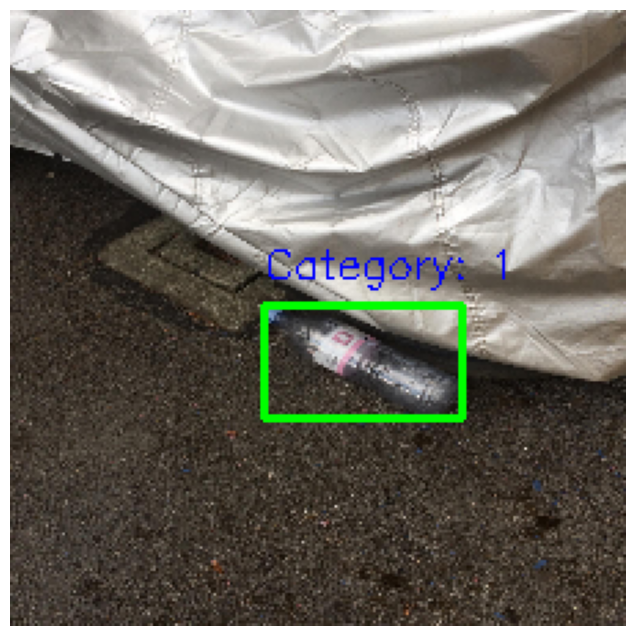

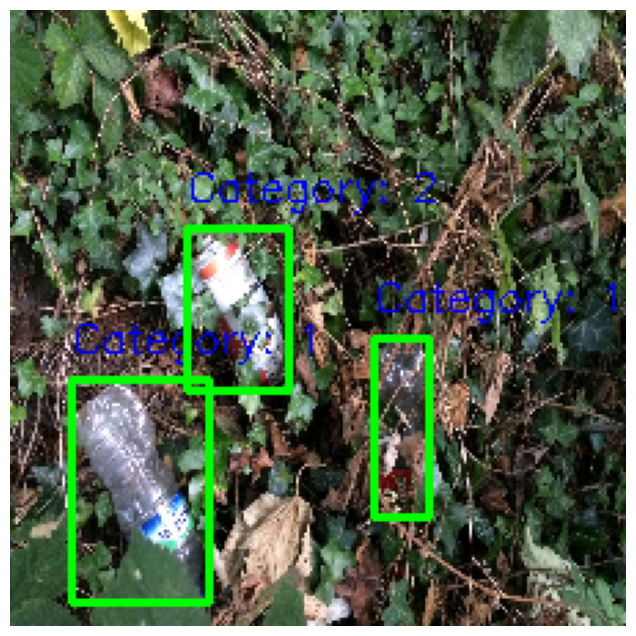

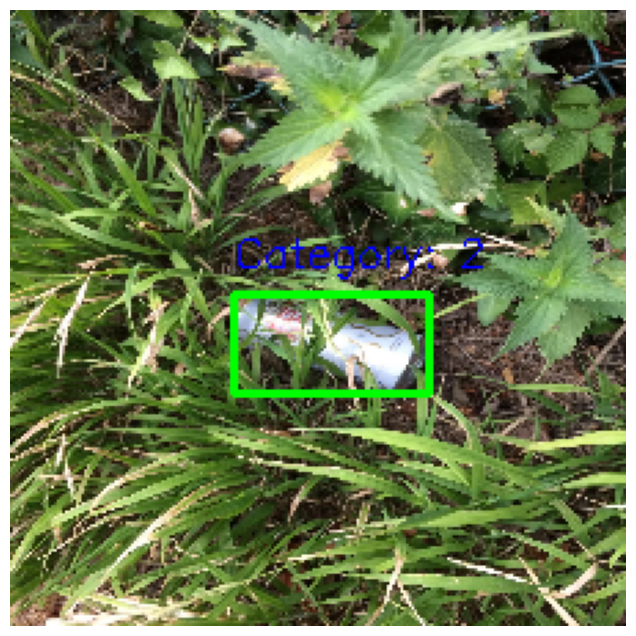

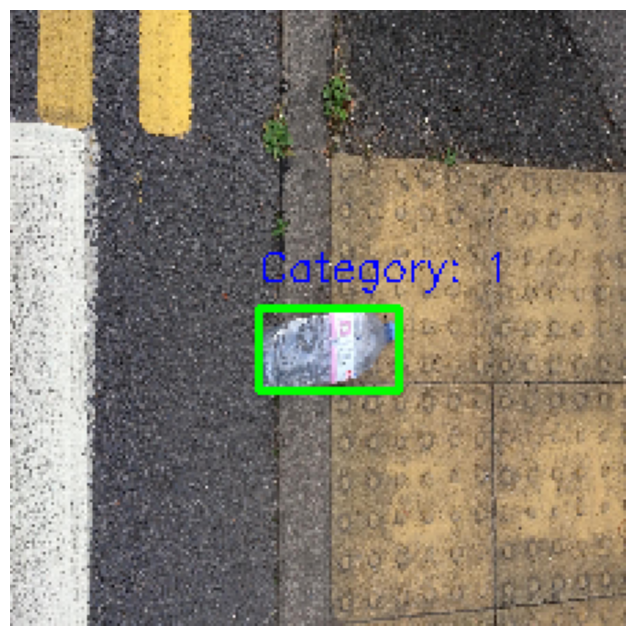

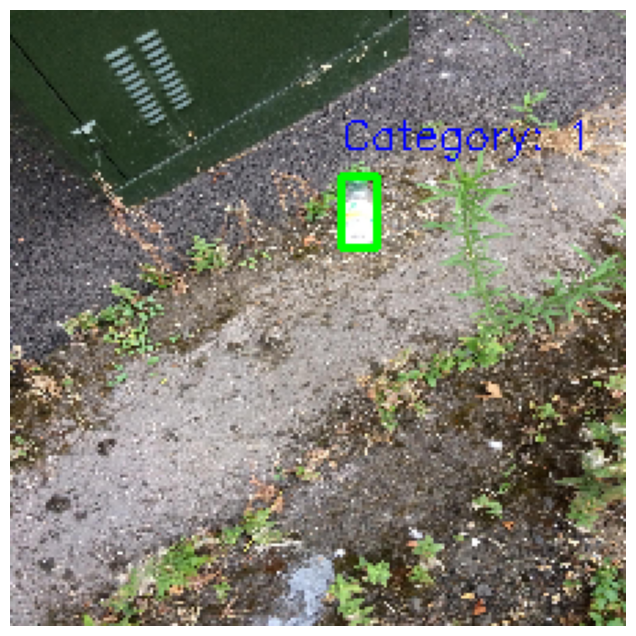

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

def load_and_display_taco_data(annotation_file, data_dir, desired_categories, target_size=(224, 224)):
    """
    Load TACO dataset and display images with bounding boxes for specified categories.
    """
    # Load the annotations
    data = load_taco_annotations(annotation_file)

    # Dictionary to group annotations by image_id
    grouped_annotations = {}
    for ann in data['annotations']:
        # Only include annotations with categories in desired_categories
        if ann['category_id'] in desired_categories:
            image_id = ann['image_id']
            if image_id not in grouped_annotations:
                grouped_annotations[image_id] = []
            # Remap category_id using desired_categories dictionary
            ann['category_id'] = desired_categories[ann['category_id']]
            grouped_annotations[image_id].append(ann)

    # Iterate through each image and display all its bounding boxes
    for image_id, annotations in list(grouped_annotations.items())[:5]:  # Display first 5 images
        image_info = next(item for item in data['images'] if item['id'] == image_id)
        image_path = os.path.join(data_dir, image_info['file_name'])

        # Load the image
        image = cv2.imread(image_path)
        if image is None:
            continue

        # Resize the image
        h_orig, w_orig = image.shape[:2]
        image_resized = cv2.resize(image, target_size)
        h_resized, w_resized = target_size

        # Draw each bounding box on the resized image
        for ann in annotations:
            # Extract bounding box (format: [x_min, y_min, width, height])
            bbox = ann['bbox']
            x_min, y_min, width, height = bbox
            x_max = x_min + width
            y_max = y_min + height

            # Convert bounding box coordinates to resized image scale
            x_min = int((x_min / w_orig) * w_resized)
            y_min = int((y_min / h_orig) * h_resized)
            x_max = int((x_max / w_orig) * w_resized)
            y_max = int((y_max / h_orig) * h_resized)

            # Draw the bounding box
            image_resized = cv2.rectangle(image_resized, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            # Optionally display category label
            label = f"Category: {ann['category_id']}"
            cv2.putText(image_resized, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

        # Display the image with all bounding boxes
        plt.figure(figsize=(8, 8))  # Optional: to make the images larger
        plt.imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
        plt.axis('off')  # Remove axis labels
        plt.show()

# Desired categories dictionary (remapped IDs)
desired_categories = {
    36: 0,  # "Plastic film"
    5: 1,   # "Clear plastic bottle"
    12: 2,  # "Drink can"

}

# Call the function to load and display images with bounding boxes for desired categories
load_and_display_taco_data(annotation_file, data_dir, desired_categories)


## Load and Preprocessing annotation, and data Split  

This function loads the TACO dataset's annotations and counts the unique category IDs to determine the number of classes. It prints and returns the total number of distinct classes found in the dataset.

In [ ]:
def get_number_of_classes(data_dir, annotation_file):
    # Load annotations from the JSON file
    with open(os.path.join(data_dir, annotation_file), 'r') as f:
        annotations = json.load(f)

    # Extract all unique category IDs
    category_ids = set(ann['category_id'] for ann in annotations['annotations'])

    # Display the number of unique categories
    num_classes = len(category_ids)+1
    print(f"Number of classes in the TACO dataset: {num_classes}")

    return num_classes

# Usage
num_classes = get_number_of_classes(data_dir, annotation_file)


Number of classes in the TACO dataset: 60


This display_classes function loads the TACO dataset's annotations and creates a mapping of category IDs to their corresponding class names. It then prints out each class ID along with its associated class name from the dataset.

In [ ]:
def display_classes(data_dir, annotation_file):
    with open(os.path.join(data_dir, annotation_file), 'r') as f:
        annotations = json.load(f)

    # Extract category names and IDs
    category_map = {cat['id']: cat['name'] for cat in annotations['categories']}
    print("Classes in the TACO dataset:")
    for cat_id, cat_name in category_map.items():
        print(f"Class ID {cat_id}: {cat_name}")

# Usage
display_classes(data_dir, annotation_file)


Classes in the TACO dataset:
Class ID 0: Aluminium foil
Class ID 1: Battery
Class ID 2: Aluminium blister pack
Class ID 3: Carded blister pack
Class ID 4: Other plastic bottle
Class ID 5: Clear plastic bottle
Class ID 6: Glass bottle
Class ID 7: Plastic bottle cap
Class ID 8: Metal bottle cap
Class ID 9: Broken glass
Class ID 10: Food Can
Class ID 11: Aerosol
Class ID 12: Drink can
Class ID 13: Toilet tube
Class ID 14: Other carton
Class ID 15: Egg carton
Class ID 16: Drink carton
Class ID 17: Corrugated carton
Class ID 18: Meal carton
Class ID 19: Pizza box
Class ID 20: Paper cup
Class ID 21: Disposable plastic cup
Class ID 22: Foam cup
Class ID 23: Glass cup
Class ID 24: Other plastic cup
Class ID 25: Food waste
Class ID 26: Glass jar
Class ID 27: Plastic lid
Class ID 28: Metal lid
Class ID 29: Other plastic
Class ID 30: Magazine paper
Class ID 31: Tissues
Class ID 32: Wrapping paper
Class ID 33: Normal paper
Class ID 34: Paper bag
Class ID 35: Plastified paper bag
Class ID 36: Plast

This code visualizes the distribution of categories in the TACO dataset by counting the number of objects and images associated with each category. It reads the annotations from a JSON file, calculates the counts for objects and unique images per category, and generates two horizontal bar charts: one showing the number of objects and the other showing the number of images per category, both sorted by object count.

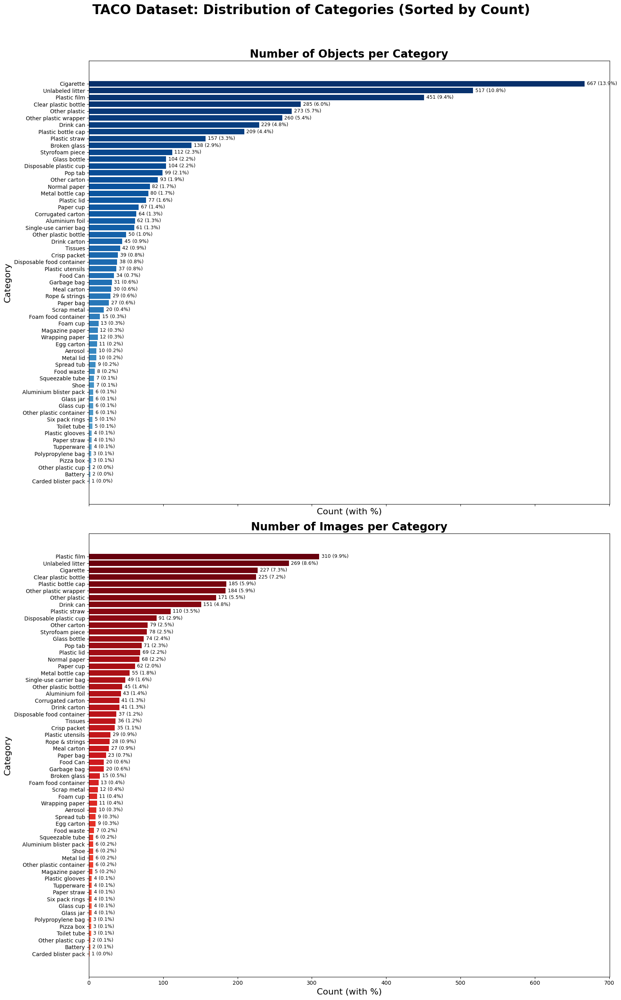

In [ ]:
def visualize_taco_categories(data_dir, annotation_file):
    """
    Visualize the TACO dataset categories with the number of objects and images per category.

    Parameters:
        data_dir (str): Directory containing the TACO dataset.
        annotation_file (str): Name of the annotations JSON file.
    """
    # Load the annotations JSON file
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Extract category information
    categories = {cat['id']: cat['name'] for cat in annotations['categories']}

    # Initialize counters
    object_count = defaultdict(int)
    image_count = defaultdict(set)

    # Count objects and images for each category
    for ann in annotations['annotations']:
        category_id = ann['category_id']
        image_id = ann['image_id']

        # Count the number of objects per category
        object_count[category_id] += 1

        # Track unique images for each category
        image_count[category_id].add(image_id)

    # Convert image_count sets to counts
    image_count = {cat_id: len(images) for cat_id, images in image_count.items()}

    # Prepare data for plotting
    data = {
        'Category': [categories[cat_id] for cat_id in object_count.keys()],
        'Number of Objects': [object_count[cat_id] for cat_id in object_count.keys()],
        'Number of Images': [image_count[cat_id] for cat_id in object_count.keys()]
    }

    # Create a pandas DataFrame
    df = pd.DataFrame(data)

    # Sort by the number of objects (Descending order)
    df_sorted_objects = df.sort_values(by='Number of Objects', ascending=True)

    # Sort by the number of images (Descending order)
    df_sorted_images = df.sort_values(by='Number of Images', ascending=True)

    # Calculate percentages for labels
    total_objects = df_sorted_objects['Number of Objects'].sum()
    total_images = df_sorted_images['Number of Images'].sum()
    df_sorted_objects['Percentage Objects'] = (df_sorted_objects['Number of Objects'] / total_objects) * 100
    df_sorted_images['Percentage Images'] = (df_sorted_images['Number of Images'] / total_images) * 100

    # Plotting horizontal histograms with enhancements
    fig, axes = plt.subplots(2, 1, figsize=(16, 26), sharex=True)
    fig.suptitle("TACO Dataset: Distribution of Categories (Sorted by Count)", fontsize=24, fontweight='bold')

    # Plot object count per category
    bars1 = axes[0].barh(
        df_sorted_objects['Category'], df_sorted_objects['Number of Objects'],
        color=plt.cm.Blues(np.linspace(0.5, 1, len(df_sorted_objects)))
    )
    axes[0].set_title("Number of Objects per Category", fontsize=20, fontweight='bold')
    axes[0].set_xlabel("Count (with %)", fontsize=16)
    axes[0].set_ylabel("Category", fontsize=16)
    axes[0].tick_params(axis='both', which='major', labelsize=10)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars1, df_sorted_objects['Number of Objects'], df_sorted_objects['Percentage Objects']):
        axes[0].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=9)

    # Plot image count per category (sorted consistently)
    bars2 = axes[1].barh(
        df_sorted_images['Category'], df_sorted_images['Number of Images'],
        color=plt.cm.Reds(np.linspace(0.5, 1, len(df_sorted_images)))
    )
    axes[1].set_title("Number of Images per Category", fontsize=20, fontweight='bold')
    axes[1].set_xlabel("Count (with %)", fontsize=16)
    axes[1].set_ylabel("Category", fontsize=16)
    axes[1].tick_params(axis='both', which='major', labelsize=10)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars2, df_sorted_images['Number of Images'], df_sorted_images['Percentage Images']):
        axes[1].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=9)

    # Tight layout adjustments
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

visualize_taco_categories(data_dir, annotation_file)

This code defines a function load_and_preprocess_taco_data to load, preprocess, and split the TACO dataset into training, validation, and test sets. It processes images and bounding boxes based on specified categories, normalizes the bounding boxes and images, resizes the images to a target size, and then splits the data into train, validation, and test sets using train_test_split. The function returns the preprocessed images, bounding boxes, and class labels for each set.

In [ ]:
import json
import os
import numpy as np
from sklearn.model_selection import train_test_split
import cv2
from tqdm import tqdm

def load_and_preprocess_taco_data(data_dir, annotation_file='TACO/annotations.json', desired_categories=None, test_size=0.1, val_size=0.2, target_size=(224, 224)):
    """
    Load images, bounding boxes, and class labels from the TACO dataset,
    normalize bounding boxes and images, filter specific categories,
    and split the dataset into train, validation, and test sets.
    """
    images = []
    bboxes = []
    classes = []

    # Load annotations from JSON
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Process annotations and images
    for ann in tqdm(annotations['annotations']):
        # Filter based on desired categories
        if desired_categories and ann['category_id'] not in desired_categories:
            continue

        image_id = ann['image_id']
        image_info = next(item for item in annotations['images'] if item['id'] == image_id)
        image_path = os.path.join(data_dir, image_info['file_name'])

        # Load the image using OpenCV
        img = cv2.imread(image_path)
        if img is None:
            continue

        # Extract bounding box and remap class label
        bbox = ann['bbox']  # Format: [x_min, y_min, width, height]
        class_label = desired_categories[ann['category_id']] if desired_categories else ann['category_id'] #####

        # Normalize bounding box coordinates
        h, w = img.shape[:2]
        bbox_normalized = [bbox[0] / w, bbox[1] / h, bbox[2] / w, bbox[3] / h]

        # Resize and normalize the image
        img_resized = cv2.resize(img, target_size)
        img_normalized = img_resized / 255.0

        # Store images, bounding boxes, and class labels
        images.append(img_normalized)
        bboxes.append(bbox_normalized)
        classes.append(class_label)

    images = np.array(images)
    bboxes = np.array(bboxes)
    classes = np.array(classes)

    # Split into train, validation, and test sets
    X_train, X_temp, y_train_bboxes, y_temp_bboxes, y_train_classes, y_temp_classes = train_test_split(
        images, bboxes, classes, test_size=test_size + val_size, random_state=42)

    val_size_adjusted = val_size / (val_size + test_size)  # Adjust validation split within the remaining data
    X_val, X_test, y_val_bboxes, y_test_bboxes, y_val_classes, y_test_classes = train_test_split(
        X_temp, y_temp_bboxes, y_temp_classes, test_size=val_size_adjusted, random_state=42)

    return (X_train, y_train_bboxes, y_train_classes), (X_val, y_val_bboxes, y_val_classes), (X_test, y_test_bboxes, y_test_classes)

# Usage example with desired categories
desired_categories = {
    36: 0,  # "Plastic film"
    5: 1,   # "Clear plastic bottle"
    12: 2,  # "Drink can"

}
(train_images, train_bboxes, train_classes), (val_images, val_bboxes, val_classes), (test_images, test_bboxes, test_classes) = load_and_preprocess_taco_data(data_dir, annotation_file, desired_categories)


100%|██████████| 4784/4784 [01:01<00:00, 77.90it/s] 


## Implementation of a CNN for Object Detection

In [ ]:
tf.config.run_functions_eagerly(True)


## Custom Loss fct implementation

This function custom_loss computes a combined loss for an object detection task by calculating both bounding box and classification losses. It first extracts the ground truth and predicted bounding boxes (bbox_true, bbox_pred) and class labels (class_true, class_pred), then computes the loss for bounding boxes using Smooth L1 loss (Huber loss) and classification loss using Sparse Categorical Crossentropy. These two losses are summed to return the total loss, which is used to optimize the model. Debug print statements help in inspecting the input/output values during training.

In [ ]:
def custom_loss(y_true, y_pred):
    # Extract ground truth bounding boxes and class labels
    bbox_true = y_true[:, :4]
    class_true = tf.cast(y_true[:, 4], tf.int32)

    # Extract predictions
    bbox_pred = y_pred[:, :4]
    class_pred = y_pred[:, 4:]

    # Debug prints to see the input/output values
    print(f"bbox_true: {bbox_true[:5]}")
    print(f"class_true: {class_true[:5]}")
    print(f"bbox_pred: {bbox_pred[:5]}")
    print(f"class_pred: {class_pred[:5]}")

    # Compute bounding box loss using Smooth L1 loss (Huber loss)
    bbox_loss = tf.reduce_mean(tf.losses.huber(bbox_true, bbox_pred))

    # Compute classification loss (Sparse Categorical Crossentropy)
    class_loss_fn = SparseCategoricalCrossentropy()
    class_loss = tf.reduce_mean(class_loss_fn(class_true, class_pred))

    # Combine the two losses
    total_loss = bbox_loss + class_loss
    print(f"Bbox Loss: {bbox_loss.numpy()}, Class Loss: {class_loss.numpy()}, Total Loss: {total_loss.numpy()}")

    return total_loss


## Functions for evaluation after aech epoch

In this code, we’re evaluating the performance of our object detection model using key metrics like Intersection over Union (IoU), Average Precision (AP), and mean Average Precision (mAP). The compute_iou function calculates the IoU between predicted and ground truth bounding boxes, which tells us how well the predicted box overlaps with the actual object. The compute_ap function calculates the Average Precision for a class by comparing the predicted bounding boxes with the ground truth, considering true positives, false positives, and false negatives, and using the IoU threshold. Then, we use the compute_map_at_multiple_iou function to calculate the mean Average Precision at different IoU thresholds (e.g., 0.5, 0.75), which gives us a more complete evaluation of our model’s accuracy. Finally, the EvaluationCallback class is a custom Keras callback that computes these metrics at the end of each training epoch so we can track how well our model is performing in real-time during training.

In [ ]:
import numpy as np
from tensorflow.keras.callbacks import Callback

# IoU calculation
def compute_iou(bbox1, bbox2):
    x1, y1, w1, h1 = bbox1
    x2, y2, w2, h2 = bbox2

    # Calculate the intersection coordinates
    x_inter = max(x1, x2)
    y_inter = max(y1, y2)
    w_inter = min(x1 + w1, x2 + w2) - x_inter
    h_inter = min(y1 + h1, y2 + h2) - y_inter

    # No intersection
    if w_inter <= 0 or h_inter <= 0:
        return 0.0

    # Calculate areas
    intersection_area = w_inter * h_inter
    bbox1_area = w1 * h1
    bbox2_area = w2 * h2
    union_area = bbox1_area + bbox2_area - intersection_area

    return intersection_area / union_area

def compute_ap(pred_bboxes, true_bboxes, pred_classes, true_classes, iou_threshold=0.5):
    """Compute Average Precision (AP) for a single class."""
    tp = []
    fp = []
    fn = []  # False negatives
    matched = set()  # To track already-matched ground truth boxes

    # Sort predictions by confidence (assume descending confidence scores)
    predictions = list(zip(pred_bboxes, pred_classes))
    predictions = sorted(predictions, key=lambda x: -x[1])  # Sort by confidence

    for pred_bbox, pred_class in predictions:
        found_match = False
        for i, true_bbox in enumerate(true_bboxes):
            if i in matched:  # Skip if this ground truth is already matched
                continue
            iou = compute_iou(pred_bbox, true_bbox)
            if iou >= iou_threshold and pred_class == true_classes[i]:
                found_match = True
                matched.add(i)
                break

        if found_match:
            tp.append(1)
            fp.append(0)
            fn.append(0)  # No false negative because we have a match
        else:
            tp.append(0)
            fp.append(1)
            fn.append(1)  # False negative because no match

    # Convert to cumulative TP, FP, FN
    tp = np.cumsum(tp)
    fp = np.cumsum(fp)
    fn = np.cumsum(fn)

    # Calculate precision and recall, ensuring no negative values
    precision = np.clip(tp / (tp + fp + 1e-16), 0, 1)  # Clipping to 0-1 range
    recall = np.clip(tp / (tp + fn + 1e-16), 0, 1)  # Clipping to 0-1 range

    # Compute AP as the area under the precision-recall curve
    ap = 0
    for i in range(len(precision) - 1):
        ap += (recall[i + 1] - recall[i]) * precision[i + 1]

    return ap, precision[-1], recall[-1]


# Compute mean Average Precision (mAP) at multiple IoU thresholds
def compute_map_at_multiple_iou(pred_bboxes, true_bboxes, pred_classes, true_classes, iou_thresholds=[0.5, 0.75, 0.9]):
    aps = []
    for iou_threshold in iou_thresholds:
        ap, precision, recall = compute_ap(pred_bboxes, true_bboxes, pred_classes, true_classes, iou_threshold)
        aps.append(ap)
        print(f"IoU Threshold: {iou_threshold:.2f} | AP: {ap:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}")

    map_value = np.mean(aps)
    map_value = abs(map_value)
    return map_value


# Custom callback for evaluation
class EvaluationCallback(Callback):
    def __init__(self, val_images, val_bboxes, val_classes, iou_threshold=0.5):
        super().__init__()
        self.val_images = val_images
        self.val_bboxes = val_bboxes
        self.val_classes = val_classes
        self.iou_threshold = iou_threshold
        self.precisions = []
        self.recalls = []
        self.map_50s = []
        self.map_50_95s = []

    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            logs = {}

        # Predict bounding boxes and class labels for the validation set
        predictions = self.model.predict(self.val_images)
        pred_bboxes = predictions[:, :4]  # First 4 columns are bounding box predictions
        pred_classes = np.argmax(predictions[:, 4:], axis=-1)

        # Compute precision and recall
        ap_50, precision, recall = compute_ap(
            pred_bboxes, self.val_bboxes,
            pred_classes, self.val_classes,
            iou_threshold=self.iou_threshold
        )

        # Compute mAP@50
        ap_50 = self.compute_map_50(pred_bboxes, self.val_bboxes, pred_classes, self.val_classes)

        # Compute mAP@50-95
        map_50_95 = self.compute_map_50_95(pred_bboxes, self.val_bboxes, pred_classes, self.val_classes)

        # Store metrics for plotting
        self.precisions.append(precision)
        self.recalls.append(recall)
        self.map_50s.append(ap_50)
        self.map_50_95s.append(map_50_95)

    def compute_map_50(self, pred_bboxes, val_bboxes, pred_classes, val_classes):
        return compute_map_at_multiple_iou(pred_bboxes, val_bboxes, pred_classes, val_classes, iou_thresholds=[0.5])

    def compute_map_50_95(self, pred_bboxes, val_bboxes, pred_classes, val_classes):
        return compute_map_at_multiple_iou(pred_bboxes, val_bboxes, pred_classes, val_classes, iou_thresholds=[0.5, 0.75, 0.9])


The LossTrackingCallback class is a custom Keras callback designed to track the training and validation losses during model training. It inherits from the Callback class and overrides the on_epoch_end method, which is executed at the end of each training epoch. In the constructor (__init__), we initialize lists to store the training and validation losses for both the overall loss and specific loss components like bounding box (bbox) loss and class loss. At the end of each epoch, the on_epoch_end method appends the values of the total loss, validation loss, bbox loss, and class loss to their respective lists, allowing us to track and plot these values over time. This helps in visualizing the model’s performance, including how the model is improving in both localization (bbox loss) and classification (class loss), and provides insight into how well the model generalizes on the validation set.

In [ ]:
class LossTrackingCallback(Callback):
    def __init__(self):
        super().__init__()
        self.losses = []
        self.val_losses = []
        self.bbox_losses = []
        self.class_losses = []
        self.val_bbox_losses = []
        self.val_class_losses = []

    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            logs = {}

        # Append loss and validation loss for plotting later
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))

        # Collect the bbox and class losses
        bbox_loss = logs.get('bbox_loss', 0)
        class_loss = logs.get('class_loss', 0)
        self.bbox_losses.append(bbox_loss)
        self.class_losses.append(class_loss)

        # Collect validation bbox and class losses
        val_bbox_loss = logs.get('val_bbox_loss', 0)
        val_class_loss = logs.get('val_class_loss', 0)
        self.val_bbox_losses.append(val_bbox_loss)
        self.val_class_losses.append(val_class_loss)


## CNN Architecture, Build and Compile

In [ ]:
from tensorflow.keras.optimizers import Adam

def build_deeper_object_detection_model(input_shape=(224, 224, 3), num_classes=3): # num_classes= reduce to 3
    input_layer = Input(shape=input_shape)

    # Deeper Convolutional layers
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(input_layer)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Flatten()(x)
    x = layers.Dense(512, activation='relu')(x) # 1024 >> 512
    x = layers.Dropout(0.5)(x)

    # Bounding box output (4 values)
    bbox_output = layers.Dense(4, activation='linear')(x)

    # Class output (classification)
    class_output = layers.Dense(num_classes, activation='softmax')(x)

    # Concatenate the outputs
    output = layers.Concatenate()([bbox_output, class_output])

    model = Model(inputs=input_layer, outputs=output)
    return model

# Build and compile the deeper model
model_1 = build_deeper_object_detection_model(input_shape=(224, 224, 3), num_classes=3)
optimizer = Adam(learning_rate=1e-3) # 1e-4 >> 1e-3
model_1.compile(optimizer=optimizer, loss=custom_loss)
model_1.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 224, 224, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 112, 112, 64)   │              0 │ conv2d[0][0]           │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 112, 112, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 56, 56, 128)    │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 56, 56, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 28, 28, 256)    │              0 │ conv2d_2[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 28, 28, 512)    │      1,180,160 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 14, 14, 512)    │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 100352)         │              0 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 512)            │     51,380,736 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 512)            │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 4)              │          2,052 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 3)              │          1,539 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 7)              │              0 │ dense_1[0][0],         │
│                           │                        │                │ dense_2[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 52,935,303 (201.93 MB)

 Trainable params: 52,935,303 (201.93 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras.losses import SparseCategoricalCrossentropy

train_classes = train_classes.reshape(-1, 1)  # Shape should be (batch_size, 1)
val_classes = val_classes.reshape(-1, 1)

train_targets = np.concatenate([train_bboxes, train_classes], axis=-1)
val_targets = np.concatenate([val_bboxes, val_classes], axis=-1)

## Train before Augmentation

In [ ]:
# Instantiate the evaluation callback
loss_callback = LossTrackingCallback()
evaluation_callback = EvaluationCallback(
    val_images=val_images,
    val_bboxes=val_bboxes,
    val_classes=val_classes,
    iou_threshold=0.5
)

# Train the model with the callback
history = model_1.fit(
    train_images,
    train_targets,
    validation_data=(val_images, val_targets),
    epochs=50, # 50 - 100 # add learning rate #  # batch processing # Linear for bbox # weighting the loss
    batch_size=32, # 32
    callbacks=[evaluation_callback]
)


/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
 [ 0.31766516  0.5684466   0.19924644  0.16061805]
 [ 0.20082545  1.2065523  -0.02289573  0.07903059]]
class_pred: [[3.9019666e-03 9.8619789e-01 9.9001750e-03]
 [9.1914588e-04 5.5878018e-03 9.9349302e-01]
 [4.0974863e-02 9.5796651e-01 1.0585983e-03]
 [9.6034101e-04 9.9897963e-01 6.0042184e-05]
 [9.9977022e-01 2.2018563e-04 9.6246349e-06]]
Bbox Loss: 0.016226155683398247, Class Loss: 0.1584678739309311, Total Loss: 0.1746940314769745
 7/22 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.1927bbox_true: [[0.34191176 0.36243874 0.1875     0.06709559]
 [0.34650734 0.6376634  0.12316176 0.13929738]
 [0.0078125  0.26513672 0.13802083 0.04345703]
 [0.40749574 0.51332664 0.16381072 0.13541667]
 [0.38602942 0.7414216  0.03431373 0.0848652 ]]
class_true: [1 0 0 2 0]
bbox_pred: [[0.4425575  0.53188515 0.3214375  0.11912565]
 [0.3565898  0.71687853 0.31562313 0.32111797]
 [0.5203531  0.5024611  0.15705737 0.07440358]
 [0.27529365 0.5039878  0.28603566

## **Visualization of Evaluation Metrics During Training**

This code visualizes the evaluation metrics (Precision, Recall, mAP@50, and mAP@50-95) after training a model. It uses matplotlib to create a plot with multiple subplots, where the first section (subplot 3) displays the performance of the model over epochs. Precision, Recall, mAP@50, and mAP@50-95 are plotted against the number of epochs, each with distinct colors and markers for clarity

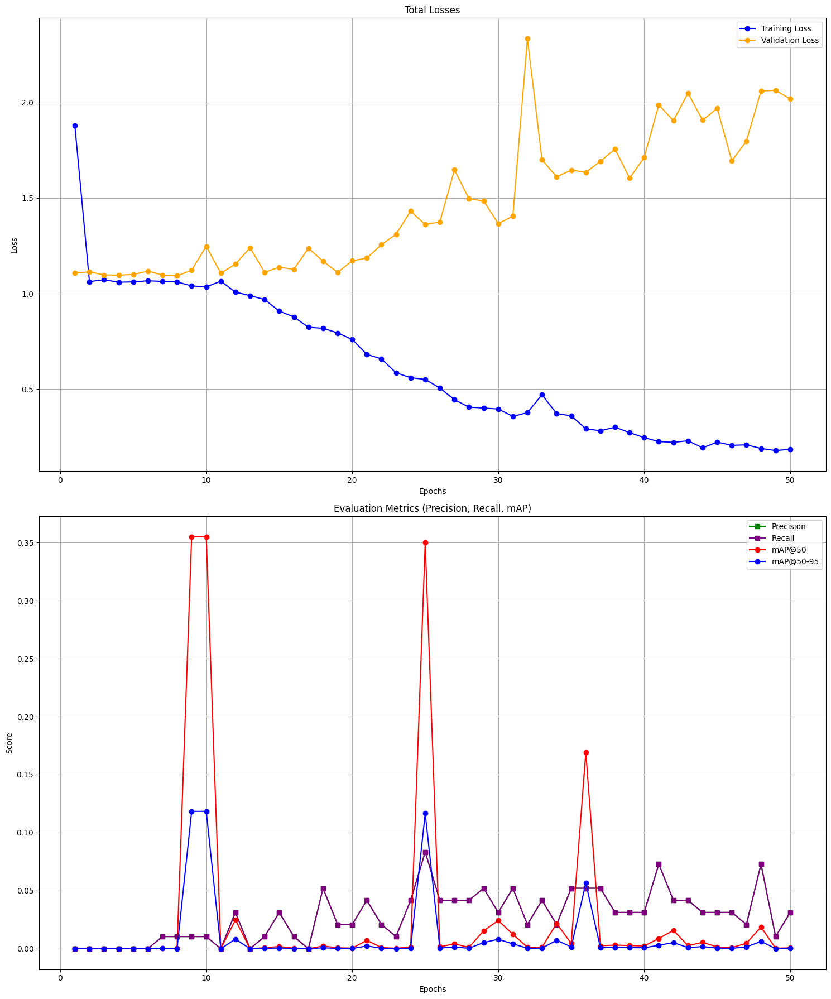

In [ ]:
# Plot all metrics after training
plt.figure(figsize=(15, 18))

# Plot Total Losses
plt.subplot(2, 1, 1)
plt.plot(range(1, len(loss_callback.losses) + 1), loss_callback.losses, label='Training Loss', marker='o', color='blue', linestyle='-')
plt.plot(range(1, len(loss_callback.val_losses) + 1), loss_callback.val_losses, label='Validation Loss', marker='o', color='orange', linestyle='-')
plt.title('Total Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot Evaluation Metrics (Precision, Recall, mAP@50)
plt.subplot(2, 1, 2)
plt.plot(range(1, len(evaluation_callback.precisions) + 1), evaluation_callback.precisions, label='Precision', marker='s', color='green', linestyle='-')
plt.plot(range(1, len(evaluation_callback.recalls) + 1), evaluation_callback.recalls, label='Recall', marker='s', color='purple', linestyle='-')
plt.plot(range(1, len(evaluation_callback.map_50s) + 1), evaluation_callback.map_50s, label='mAP@50', marker='o', color='red', linestyle='-')
plt.plot(range(1, len(evaluation_callback.map_50_95s) + 1), evaluation_callback.map_50_95s, label='mAP@50-95', marker='o', color='blue', linestyle='-')
plt.title('Evaluation Metrics (Precision, Recall, mAP)')
plt.xlabel('Epochs')
plt.ylabel('Score')
plt.legend()
plt.grid(True)

# Show the plots
plt.tight_layout()
plt.show()


## Evaluate the model before Augmentation

In [ ]:
val_loss = model_1.evaluate(val_images, val_targets, batch_size=32)

test_classes = test_classes.reshape(-1, 1)  # Shape should be (batch_size, 1)
test_targets = np.concatenate([test_bboxes, test_classes], axis=-1)
test_loss = model_1.evaluate(test_images, test_targets, batch_size=32)

predictions = model_1.predict(test_images, batch_size=32)

# Separate bounding boxes and class probabilities
pred_bboxes = predictions[:, :4]  # Bounding boxes
pred_classes = np.argmax(predictions[:, 4:], axis=-1)  # Class predictions
ious = [compute_iou(pred_bboxes[i], test_bboxes[i]) for i in range(len(test_bboxes))]
mean_iou = np.mean(ious)

map_50_95 = compute_map_at_multiple_iou(pred_bboxes, test_bboxes, pred_classes, test_classes, iou_thresholds=[0.5, 0.75, 0.9])






bbox_true: [[0.51346153 0.09903846 0.31057692 0.74903846]
 [0.5900735  0.19281046 0.09283088 0.3272059 ]
 [0.38429487 0.1579327  0.2628205  0.42668268]
 [0.31699347 0.4886642  0.05187909 0.07230392]
 [0.34823847 0.4666054  0.08039747 0.06954657]]
class_true: [1 0 1 0 0]
bbox_pred: [[0.29388422 0.15316258 0.17952824 0.28188893]
 [0.5894169  0.25352067 0.10691347 0.18795577]
 [0.26626995 0.33751583 0.25348556 0.24939063]
 [0.41233674 0.3878944  0.21098009 0.21376067]
 [0.38656497 0.3809268  0.12261868 0.07758296]]
class_pred: [[9.2907315e-03 9.8665464e-01 4.0546707e-03]
 [9.9537271e-01 4.5869085e-03 4.0332179e-05]
 [9.5131207e-01 3.5393815e-02 1.3294154e-02]
 [8.0062646e-01 1.9822992e-01 1.1436056e-03]
 [4.0566379e-01 2.0132345e-01 3.9301279e-01]]
Bbox Loss: 0.01806599088013172, Class Loss: 1.2363815307617188, Total Loss: 1.25444757938385
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 1.2544bbox_true: [[0.5763889  0.30177698 0.01348039 0.02696078]
 [0.63235295 0.51409316 0.22222222 0.1084

## Model Evaluation: Validation and Test Performance metrics

In [ ]:
import tensorflow as tf

writer = tf.summary.create_file_writer("./logs")
with writer.as_default():
    tf.summary.scalar("Mean IoU", mean_iou, step=0)
    tf.summary.scalar("mAP@50-95", map_50_95, step=0)


In [ ]:
# Metrics on Test Data
predictions = model_1.predict(test_images, batch_size=32)
pred_bboxes = predictions[:, :4]
pred_classes = np.argmax(predictions[:, 4:], axis=-1)
mean_iou = np.mean([compute_iou(pred_bboxes[i], test_bboxes[i]) for i in range(len(test_bboxes))])
map_50_95 = compute_map_at_multiple_iou(pred_bboxes, test_bboxes, pred_classes, test_classes)

print(f"Validation Loss: {val_loss}")
print(f"Test Loss: {test_loss}")
print(f"Mean IoU: {mean_iou}")
print(f"mAP@50-95: {map_50_95}")


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
IoU Threshold: 0.50 | AP: 0.0078 | Precision: 0.0928 | Recall: 0.0928
IoU Threshold: 0.75 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
IoU Threshold: 0.90 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
Validation Loss: 1.7590036392211914
Test Loss: 1.675763487815857
Mean IoU: 0.039826967047593365
mAP@50-95: 0.002611301954680998


**Confusion matrix before data augmentation for model_1**

Confusion Matrix:
[[62 19  3]
 [24 27  8]
 [23 11 17]]


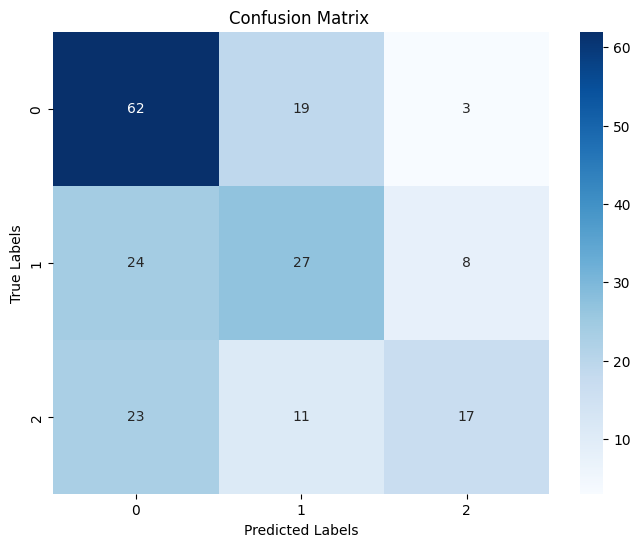

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

cm_model_1 = confusion_matrix(test_classes,pred_classes)

# Print confusion matrix
print("Confusion Matrix:")
print(cm_model_1)

# Plot Confusion Matrix using Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm_model_1, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(test_classes), yticklabels=np.unique(test_classes))
plt.title('Confusion Matrix ')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


In [ ]:
def visualize_taco_categories(data_dir, annotation_file):
    """
    Visualize the TACO dataset categories with the number of objects and images per category.

    Parameters:
        data_dir (str): Directory containing the TACO dataset.
        annotation_file (str): Name of the annotations JSON file.
    """
    # Load the annotations JSON file
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Extract category information
    categories = {cat['id']: cat['name'] for cat in annotations['categories']}

    # Initialize counters
    object_count = defaultdict(int)
    image_count = defaultdict(set)

    # Count objects and images for each category
    for ann in annotations['annotations']:
        category_id = ann['category_id']
        image_id = ann['image_id']

        # Count the number of objects per category
        object_count[category_id] += 1

        # Track unique images for each category
        image_count[category_id].add(image_id)

    # Convert image_count sets to counts
    image_count = {cat_id: len(images) for cat_id, images in image_count.items()}

    # Prepare data for plotting
    data = {
        'Category': [categories[cat_id] for cat_id in object_count.keys()],
        'Number of Objects': [object_count[cat_id] for cat_id in object_count.keys()],
        'Number of Images': [image_count[cat_id] for cat_id in object_count.keys()]
    }

    # Create a pandas DataFrame
    df = pd.DataFrame(data)

    # Sort by the number of objects (Descending order)
    df_sorted_objects = df.sort_values(by='Number of Objects', ascending=True)

    # Sort by the number of images (Descending order)
    df_sorted_images = df.sort_values(by='Number of Images', ascending=True)

    # Calculate percentages for labels
    total_objects = df_sorted_objects['Number of Objects'].sum()
    total_images = df_sorted_images['Number of Images'].sum()
    df_sorted_objects['Percentage Objects'] = (df_sorted_objects['Number of Objects'] / total_objects) * 100
    df_sorted_images['Percentage Images'] = (df_sorted_images['Number of Images'] / total_images) * 100

    # Plotting horizontal histograms with enhancements
    fig, axes = plt.subplots(2, 1, figsize=(16, 26), sharex=True)
    fig.suptitle("TACO Dataset: Distribution of Categories (Sorted by Count)", fontsize=24, fontweight='bold')

    # Plot object count per category
    bars1 = axes[0].barh(
        df_sorted_objects['Category'], df_sorted_objects['Number of Objects'],
        color=plt.cm.Blues(np.linspace(0.5, 1, len(df_sorted_objects)))
    )
    axes[0].set_title("Number of Objects per Category", fontsize=20, fontweight='bold')
    axes[0].set_xlabel("Count (with %)", fontsize=16)
    axes[0].set_ylabel("Category", fontsize=16)
    axes[0].tick_params(axis='both', which='major', labelsize=10)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars1, df_sorted_objects['Number of Objects'], df_sorted_objects['Percentage Objects']):
        axes[0].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=9)

    # Plot image count per category (sorted consistently)
    bars2 = axes[1].barh(
        df_sorted_images['Category'], df_sorted_images['Number of Images'],
        color=plt.cm.Reds(np.linspace(0.5, 1, len(df_sorted_images)))
    )
    axes[1].set_title("Number of Images per Category", fontsize=20, fontweight='bold')
    axes[1].set_xlabel("Count (with %)", fontsize=16)
    axes[1].set_ylabel("Category", fontsize=16)
    axes[1].tick_params(axis='both', which='major', labelsize=10)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars2, df_sorted_images['Number of Images'], df_sorted_images['Percentage Images']):
        axes[1].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=9)

    # Tight layout adjustments
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

visualize_taco_categories(data_dir, annotation_file)

In [ ]:
# Calculate accuracy
accuracy = np.trace(cm_model_1) / np.sum(cm_model_1) * 100

# Calculate precision and recall for each class
precision = np.diagonal(cm_model_1) / np.sum(cm_model_1, axis=0) * 100
recall = np.diagonal(cm_model_1) / np.sum(cm_model_1, axis=1) * 100

# Print precision, recall, and accuracy for each class
for i in range(cm_model_1.shape[0]):
    print(f"Class {i}: Accuracy = {accuracy:.4f}, Precision = {precision[i]:.4f}, Recall = {recall[i]:.4f}")


Class 0: Accuracy = 54.6392, Precision = 56.8807, Recall = 73.8095
Class 1: Accuracy = 54.6392, Precision = 47.3684, Recall = 45.7627
Class 2: Accuracy = 54.6392, Precision = 60.7143, Recall = 33.3333


In [ ]:
# Save the model in the native Keras format
model_1.save('model_1.keras')  # Saves the model as a single file


## Implement Data Augmentation

This code filters a dataset of annotations to focus on specific categories of interest, identified by their unique IDs. It begins by defining the target categories as [5, 12, 36], which correspond to particular objects, such as "Clear plastic bottle," "Drink can," and "Plastic film." The dataset, data['annotations'], contains a list of annotations for objects in images, with each annotation including details like the object's category ID and bounding box. Using a list comprehension, the code iterates through all annotations and selects only those whose category_id matches one of the specified target categories. The filtered results are stored in the filtered_annotations list, which now contains only the relevant data. This step streamlines the dataset, ensuring that further processing or analysis focuses solely on the desired categories, improving efficiency and clarity

In [ ]:
# Categories of interest
target_categories = [5, 12, 36]

# Filter annotations for the target categories
filtered_annotations = [ann for ann in data['annotations'] if ann['category_id'] in target_categories]


In [ ]:
# Count objects for target categories
def count_objects_for_targets(filtered_annotations, target_categories):
    counts = {cat: 0 for cat in target_categories}
    for ann in filtered_annotations:
        if ann['category_id'] in counts:
            counts[ann['category_id']] += 1
    return counts

target_object_counts = count_objects_for_targets(filtered_annotations, target_categories)
print("Target object counts:", target_object_counts)


Target object counts: {5: 285, 12: 229, 36: 451}


This code defines a function, visualize_taco_categories_horizontal, to generate a horizontal bar chart showing the distribution of objects across different categories in the TACO dataset The function begins by loading the annotations and extracting category information.


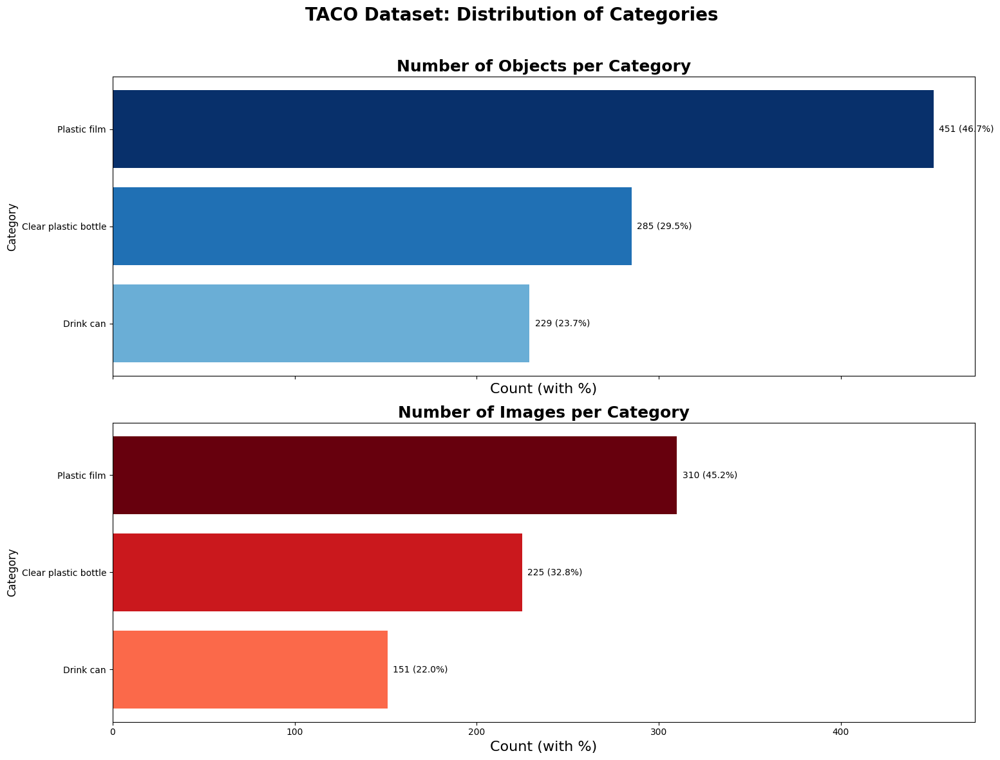

In [ ]:
def visualize_taco_desired_categories(data_dir, annotation_file, desired_categories=None):
    """
    Visualize the distribution of categories in the TACO dataset as a side-by-side
    bar chart for object counts and image counts per category.

    Parameters:
    - data_dir (str): Directory where the dataset is located.
    - annotation_file (str): Path to the annotations JSON file.
    - desired_categories (dict, optional): A mapping from category IDs to desired class labels.
    """

    # Load the annotations JSON file
    with open(os.path.join(data_dir, annotation_file)) as f:
        annotations = json.load(f)

    # Extract category information
    categories = {cat['id']: cat['name'] for cat in annotations['categories']}

    # If desired_categories is provided, filter the annotations
    if desired_categories:
        valid_category_ids = set(desired_categories.keys())
        categories = {cat_id: categories[cat_id] for cat_id in valid_category_ids}
    else:
        valid_category_ids = set(categories.keys())

    # Initialize counters
    object_count = defaultdict(int)
    image_count = defaultdict(set)

    # Count objects and images for each category
    for ann in annotations['annotations']:
        category_id = ann['category_id']
        image_id = ann['image_id']

        if category_id in valid_category_ids:
            # Count the number of objects per category
            object_count[category_id] += 1

            # Track unique images for each category
            image_count[category_id].add(image_id)

    # Convert image_count sets to counts
    image_count = {cat_id: len(images) for cat_id, images in image_count.items()}

    # Prepare data for plotting
    category_names = [categories[cat_id] for cat_id in object_count.keys()]
    num_objects = [object_count[cat_id] for cat_id in object_count.keys()]
    num_images = [image_count[cat_id] for cat_id in image_count.keys()]

    # Sort by the number of objects in ascending order
    sorted_indices = sorted(range(len(num_objects)), key=lambda i: num_objects[i])
    category_names_sorted = [category_names[i] for i in sorted_indices]
    num_objects_sorted = [num_objects[i] for i in sorted_indices]
    num_images_sorted = [num_images[i] for i in sorted_indices]

    # Prepare data for plotting percentages
    total_objects = sum(num_objects_sorted)
    total_images = sum(num_images_sorted)
    percentage_objects = [(count / total_objects) * 100 for count in num_objects_sorted]
    percentage_images = [(count / total_images) * 100 for count in num_images_sorted]

    # Plotting horizontal histograms with enhancements
    fig, axes = plt.subplots(2, 1, figsize=(16, 12), sharex=True)
    fig.suptitle("TACO Dataset: Distribution of Categories", fontsize=20, fontweight='bold')

    # Object count bars
    bars1 = axes[0].barh(
        category_names_sorted, num_objects_sorted,
        color=plt.cm.Blues(np.linspace(0.5, 1, len(num_objects_sorted)))
    )
    axes[0].set_title("Number of Objects per Category", fontsize=18, fontweight='bold')
    axes[0].set_xlabel("Count (with %)", fontsize=16)
    axes[0].set_ylabel("Category", fontsize=12)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars1, num_objects_sorted, percentage_objects):
        axes[0].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=10)

    # Image count bars
    bars2 = axes[1].barh(
        category_names_sorted, num_images_sorted,
        color=plt.cm.Reds(np.linspace(0.5, 1, len(num_images_sorted)))
    )
    axes[1].set_title("Number of Images per Category", fontsize=18, fontweight='bold')
    axes[1].set_xlabel("Count (with %)", fontsize=16)
    axes[1].set_ylabel("Category", fontsize=12)

    # Annotate bars with percentages and counts
    for bar, count, percentage in zip(bars2, num_images_sorted, percentage_images):
        axes[1].text(bar.get_width() + 3, bar.get_y() + bar.get_height() / 2,
                     f"{count} ({percentage:.1f}%)", va='center', fontsize=10)

    # Tight layout adjustments
    plt.tight_layout(rect=[0, 0, 0.98, 0.96])  # Adjust the right margin to prevent text overflow
    plt.show()

visualize_taco_desired_categories(data_dir, annotation_file, desired_categories=desired_categories)


# **Balancing and Augmenting TACO Dataset Categories**

This code is designed to balance underrepresented categories in the TACO dataset by augmenting images. It begins by analyzing the object counts for the target categories and determining the maximum count. To achieve balance, it generates additional images using augmentation techniques such as horizontal flipping, brightness adjustment, contrast enhancement, and rotation. Augmented images are saved, and new annotations are added to the dataset. To prevent over-augmentation, a safeguard limits the number of augmentations per category. Finally, the augmented data is integrated into the existing annotations file, creating a more balanced dataset for model training.

In [ ]:
import json
import os
import tensorflow as tf
from PIL import Image, ImageOps
import numpy as np
from collections import defaultdict

# Define the maximum number of augmentations per category (safeguard)
max_augmentations_per_category = 500  # Set a reasonable limit

# Define augmentation function
def augment_image(image):
    image = Image.fromarray((image.numpy() * 255).astype(np.uint8))

    # Random horizontal flip
    if tf.random.uniform([]) > 0.5:
        image = ImageOps.mirror(image)

    # Random brightness
    delta = tf.random.uniform([], -0.2, 0.2).numpy()
    image = Image.fromarray(np.clip(np.array(image) + delta * 255, 0, 255).astype(np.uint8))

    # Random contrast
    factor = tf.random.uniform([], 0.8, 1.2).numpy()
    mean = np.mean(np.array(image), axis=(0, 1), keepdims=True)
    image = Image.fromarray(np.clip((np.array(image) - mean) * factor + mean, 0, 255).astype(np.uint8))

    # Random rotation
    angle = tf.random.uniform([], -15, 15).numpy()
    image = image.rotate(angle, resample=Image.BILINEAR)

    # Convert back to TensorFlow tensor
    image = tf.convert_to_tensor(np.array(image), dtype=tf.float32) / 255.0
    return image

# Augment and save images to balance classes
def balance_and_augment(data, filtered_annotations, target_categories, output_dir, annotations_file):
    # Count objects for each target category
    counts = defaultdict(int)
    annotations_by_category = defaultdict(list)
    for ann in filtered_annotations:
        if ann['category_id'] in target_categories:
            counts[ann['category_id']] += 1
            annotations_by_category[ann['category_id']].append(ann)

    # Determine the maximum object count
    max_count = max(counts.values())
    print(f"Target object counts: {counts}")
    print(f"Maximum count: {max_count}")

    os.makedirs(output_dir, exist_ok=True)
    augmented_annotations = []

    # Augment images for each target category
    for category_id, anns in annotations_by_category.items():
        current_count = len(anns)
        additional_needed = max_count - current_count

        # Cap the number of augmentations per category
        additional_needed = min(additional_needed, max_augmentations_per_category)

        print(f"Augmenting category {category_id}: {current_count} → {max_count} ({additional_needed} augmentations needed)")

        for i in range(additional_needed):
            ann = anns[i % current_count]  # Cycle through existing annotations
            image_path = f"/content/TACO/data/{data['images'][ann['image_id']]['file_name']}"

            # Load image
            image = Image.open(image_path).convert('RGB')
            image = tf.convert_to_tensor(np.array(image), dtype=tf.float32) / 255.0  # Normalize

            # Augment image
            augmented_image = augment_image(image)
            augmented_image = tf.image.convert_image_dtype(augmented_image, dtype=tf.uint8)  # Convert back to uint8

            # Save augmented image
            augmented_path = os.path.join(output_dir, f"aug_{category_id}_{i}.jpg")
            tf.keras.preprocessing.image.save_img(augmented_path, augmented_image.numpy())

            # Add new annotation for the augmented image
            augmented_ann = ann.copy()
            augmented_ann['file_name'] = os.path.basename(augmented_path)
            augmented_annotations.append(augmented_ann)

    # Load the existing annotations file
    with open(annotations_file, 'r') as f:
        annotations = json.load(f)

    # Add augmented annotations to the original annotations
    annotations['annotations'].extend(augmented_annotations)

    # Save the updated annotations to the file
    with open(annotations_file, 'w') as f:
        json.dump(annotations, f, indent=4)

    return augmented_annotations

# Output directory
output_dir = '/content/TACO/data/augmented'
# Run the balancing and augmentation process
balanced_augmented_annotations = balance_and_augment(data,filtered_annotations, target_categories, output_dir, annotation_file)

print(f"Augmentation complete. {len(balanced_augmented_annotations)} augmented annotations added.")

Target object counts: defaultdict(<class 'int'>, {5: 285, 12: 229, 36: 451})
Maximum count: 451
Augmenting category 5: 285 → 451 (166 augmentations needed)
Augmenting category 12: 229 → 451 (222 augmentations needed)
Augmenting category 36: 451 → 451 (0 augmentations needed)
Augmentation complete. 388 augmented annotations added.


# **Visualizing Category Distribution in the Balanced TACO Dataset after augmentations**

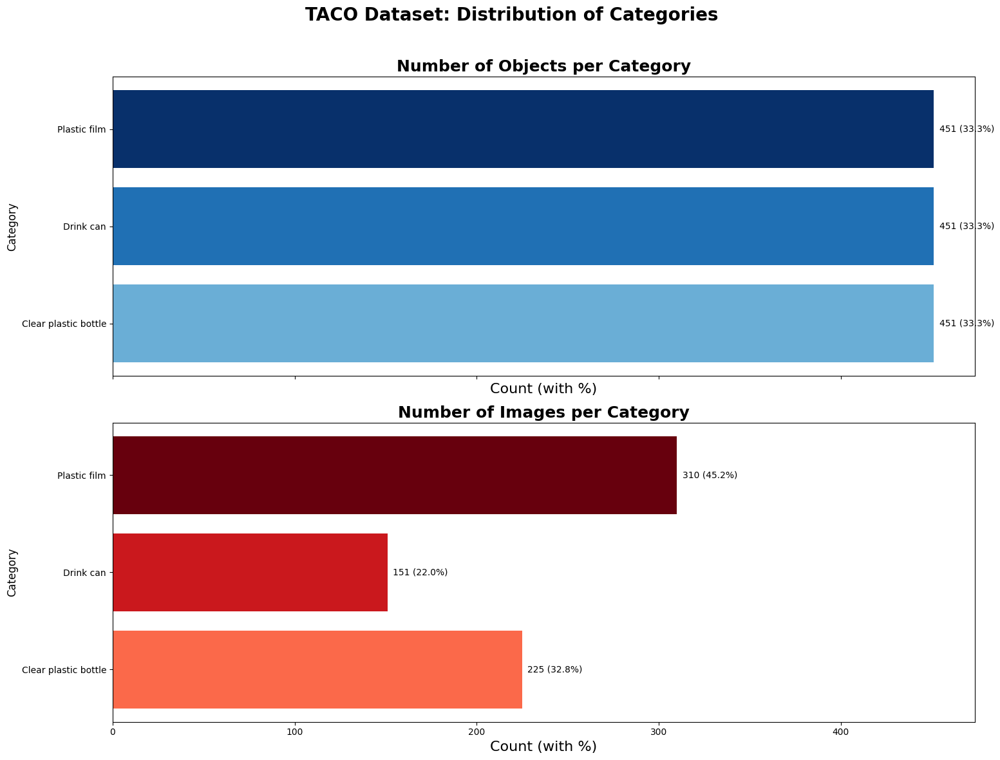

In [ ]:
visualize_taco_desired_categories(data_dir, annotation_file, desired_categories=desired_categories)

## CNN Architecture, Build and Compile after augmentation: model_2

In [ ]:
# Build and compile the deeper model
model_2 = build_deeper_object_detection_model(input_shape=(224, 224, 3), num_classes=3)
optimizer = Adam(learning_rate=1e-3) # 1e-4 >> 1e-3
model_2.compile(optimizer=optimizer, loss=custom_loss)
model_2.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 224, 224, 64)   │          1,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 112, 112, 64)   │              0 │ conv2d_4[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 112, 112, 128)  │         73,856 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5           │ (None, 56, 56, 128)    │              0 │ conv2d_5[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 56, 56, 256)    │        295,168 │ max_pooling2d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 28, 28, 256)    │              0 │ conv2d_6[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 28, 28, 512)    │      1,180,160 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_7           │ (None, 14, 14, 512)    │              0 │ conv2d_7[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 100352)         │              0 │ max_pooling2d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 512)            │     51,380,736 │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 512)            │              0 │ dense_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_4 (Dense)           │ (None, 4)              │          2,052 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_5 (Dense)           │ (None, 3)              │          1,539 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 7)              │              0 │ dense_4[0][0],         │
│ (Concatenate)             │                        │                │ dense_5[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 52,935,303 (201.93 MB)

 Trainable params: 52,935,303 (201.93 MB)

 Non-trainable params: 0 (0.00 B)

## Training after Data Augmentation : model_2

In [ ]:
loss_callback = LossTrackingCallback()
evaluation_callback = EvaluationCallback(
    val_images=val_images,
    val_bboxes=val_bboxes,
    val_classes=val_classes,
    iou_threshold=0.5
)

history = model_2.fit(
    train_images,
    train_targets,
    validation_data=(val_images, val_targets),
    epochs=50,
    batch_size=32,
    callbacks=[loss_callback, evaluation_callback]
)

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
 [ 0.4142128   0.57087594  0.23081976  0.09738567]
 [ 0.34907132  0.2653709   0.24123836  0.09708383]]
class_pred: [[4.6139844e-02 3.5992298e-01 5.9393716e-01]
 [1.4573438e-04 9.9213672e-01 7.7176285e-03]
 [9.9436980e-01 5.5348496e-03 9.5277217e-05]
 [2.0121068e-02 9.7506738e-01 4.8114886e-03]
 [1.0878079e-02 9.8817897e-01 9.4291114e-04]]
Bbox Loss: 0.01853819750249386, Class Loss: 0.21405170857906342, Total Loss: 0.23258990049362183
 7/22 ━━━━━━━━━━━━━━━━━━━━ 2s 147ms/step - loss: 0.2111bbox_true: [[0.19325    0.5746667  0.089      0.07966667]
 [0.15707672 0.39781746 0.1712963  0.10342262]
 [0.38760966 0.38525    0.18914473 0.03925   ]
 [0.4721799  0.75965446 0.06135671 0.07876016]
 [0.32451499 0.42237103 0.25925925 0.15525794]]
class_true: [0 0 0 1 0]
bbox_pred: [[ 0.6256221   0.6675326  -0.02432492 -0.02806912]
 [ 0.32647476  0.3332639   0.1501585   0.21532877]
 [ 0.47807223  0.51759756  0.19196953  0.10125854]
 [ 0.73636764  0.6522

**Visualization of Evaluation Metrics During Training after augmentation: model_2

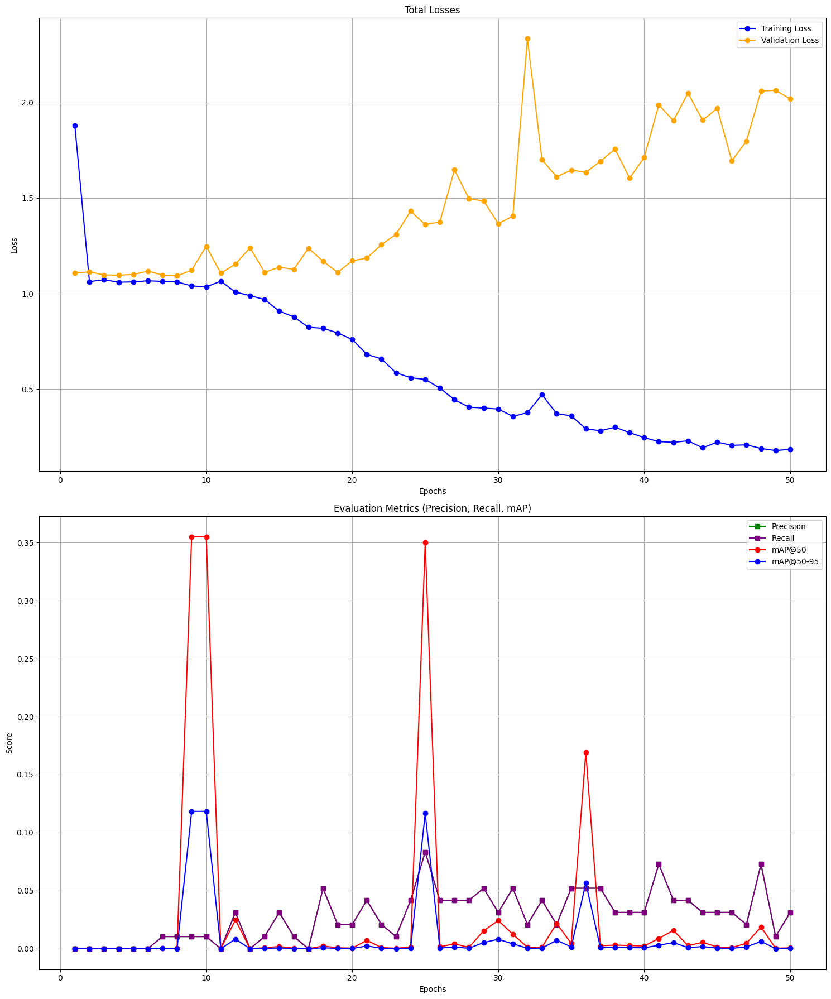

In [ ]:
# Plot all metrics after training
plt.figure(figsize=(15, 18))

# Plot Total Losses
plt.subplot(2, 1, 1)
plt.plot(range(1, len(loss_callback.losses) + 1), loss_callback.losses, label='Training Loss', marker='o', color='blue', linestyle='-')
plt.plot(range(1, len(loss_callback.val_losses) + 1), loss_callback.val_losses, label='Validation Loss', marker='o', color='orange', linestyle='-')
plt.title('Total Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot Evaluation Metrics (Precision, Recall, mAP@50)
plt.subplot(2, 1, 2)
plt.plot(range(1, len(evaluation_callback.precisions) + 1), evaluation_callback.precisions, label='Precision', marker='s', color='green', linestyle='-')
plt.plot(range(1, len(evaluation_callback.recalls) + 1), evaluation_callback.recalls, label='Recall', marker='s', color='purple', linestyle='-')
plt.plot(range(1, len(evaluation_callback.map_50s) + 1), evaluation_callback.map_50s, label='mAP@50', marker='o', color='red', linestyle='-')
plt.plot(range(1, len(evaluation_callback.map_50_95s) + 1), evaluation_callback.map_50_95s, label='mAP@50-95', marker='o', color='blue', linestyle='-')
plt.title('Evaluation Metrics (Precision, Recall, mAP)')
plt.xlabel('Epochs')
plt.ylabel('Score')
plt.legend()
plt.grid(True)

# Show the plots
plt.tight_layout()
plt.show()


**Visualizing True vs Predicted Bounding Boxes and Class Labels for Object Detection after Data augmenation**

## Evaluate the model after augmentation on the Test dataset : model_2

In [ ]:
val_loss = model_2.evaluate(val_images, val_targets, batch_size=32)

test_classes = test_classes.reshape(-1, 1)  # Shape should be (batch_size, 1)
test_targets = np.concatenate([test_bboxes, test_classes], axis=-1)
test_loss = model_2.evaluate(test_images, test_targets, batch_size=32)

predictions = model_2.predict(test_images, batch_size=32)

# Separate bounding boxes and class probabilities
pred_bboxes = predictions[:, :4]  # Bounding boxes
pred_classes = np.argmax(predictions[:, 4:], axis=-1)  # Class predictions
ious = [compute_iou(pred_bboxes[i], test_bboxes[i]) for i in range(len(test_bboxes))]
mean_iou = np.mean(ious)

map_50_95 = compute_map_at_multiple_iou(pred_bboxes, test_bboxes, pred_classes, test_classes, iou_thresholds=[0.5, 0.75, 0.9])




bbox_true: [[0.51346153 0.09903846 0.31057692 0.74903846]
 [0.5900735  0.19281046 0.09283088 0.3272059 ]
 [0.38429487 0.1579327  0.2628205  0.42668268]
 [0.31699347 0.4886642  0.05187909 0.07230392]
 [0.34823847 0.4666054  0.08039747 0.06954657]]
class_true: [1 0 1 0 0]
bbox_pred: [[0.27864897 0.27559474 0.21407014 0.23423138]
 [0.48829305 0.38965178 0.18586177 0.15127245]
 [0.35668743 0.36294302 0.17383116 0.1069974 ]
 [0.4165674  0.49748844 0.17515758 0.1606149 ]
 [0.33336136 0.3654194  0.12701352 0.15241165]]
class_pred: [[0.00915011 0.9891782  0.00167177]
 [0.9976851  0.00126561 0.00104937]
 [0.91243243 0.07553606 0.01203153]
 [0.9446381  0.04579753 0.00956437]
 [0.18581381 0.80614704 0.00803916]]
Bbox Loss: 0.017887718975543976, Class Loss: 1.445131540298462, Total Loss: 1.4630192518234253
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 1.4630bbox_true: [[0.5763889  0.30177698 0.01348039 0.02696078]
 [0.63235295 0.51409316 0.22222222 0.10845588]
 [0.26124337 0.5562996  0.17096561 0.

In [ ]:
# Metrics on Test Data
predictions = model_2.predict(test_images, batch_size=32)
pred_bboxes = predictions[:, :4]
pred_classes = np.argmax(predictions[:, 4:], axis=-1)
mean_iou = np.mean([compute_iou(pred_bboxes[i], test_bboxes[i]) for i in range(len(test_bboxes))])
map_50_95 = compute_map_at_multiple_iou(pred_bboxes, test_bboxes, pred_classes, test_classes)

print(f"Validation Loss: {val_loss}")
print(f"Test Loss: {test_loss}")
print(f"Mean IoU: {mean_iou}")
print(f"mAP@50-95: {map_50_95}")


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
IoU Threshold: 0.50 | AP: -0.3487 | Precision: 0.0876 | Recall: 0.0876
IoU Threshold: 0.75 | AP: 0.0000 | Precision: 0.0052 | Recall: 0.0052
IoU Threshold: 0.90 | AP: 0.0000 | Precision: 0.0000 | Recall: 0.0000
Validation Loss: 2.017615795135498
Test Loss: 1.6321769952774048
Mean IoU: 0.030400162988500217
mAP@50-95: 0.11622693249780973


# **Confusion matrix after augmentation : model_2**

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Confusion Matrix for Model 2:
[[63 18  3]
 [25 25  9]
 [21  9 21]]


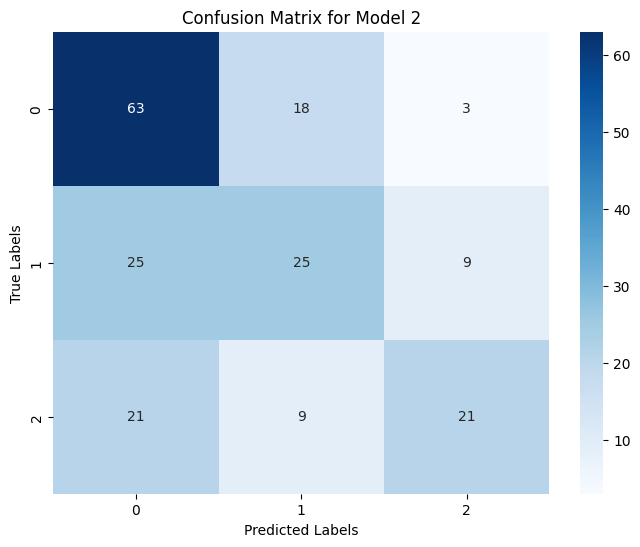

In [ ]:
# Predict class labels using model_2
predictions_model2 = model_2.predict(test_images)
pred_classes_model2 = np.argmax(predictions_model2[:, 4:], axis=-1)  # Extract class predictions

# Compute confusion matrix for model_2
from sklearn.metrics import confusion_matrix
cm_model_2 = confusion_matrix(test_classes, pred_classes_model2)

# Print confusion matrix
print("Confusion Matrix for Model 2:")
print(cm_model_2)

# Plot Confusion Matrix using Seaborn
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm_model_2, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(test_classes), yticklabels=np.unique(test_classes))
plt.title('Confusion Matrix for Model 2')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


In [ ]:
# Calculate accuracy
accuracy = np.trace(cm_model_2) / np.sum(cm_model_2) * 100

# Calculate precision and recall for each class
precision = np.diagonal(cm_model_2) / np.sum(cm_model_2, axis=0) * 100
recall = np.diagonal(cm_model_2) / np.sum(cm_model_2, axis=1) * 100

# Print precision, recall, and accuracy for each class
for i in range(cm_model_2.shape[0]):
    print(f"Class {i}: Accuracy = {accuracy:.4f}, Precision = {precision[i]:.4f}, Recall = {recall[i]:.4f}")


Class 0: Accuracy = 56.1856, Precision = 57.7982, Recall = 75.0000
Class 1: Accuracy = 56.1856, Precision = 48.0769, Recall = 42.3729
Class 2: Accuracy = 56.1856, Precision = 63.6364, Recall = 41.1765


In [ ]:
# Save the model in the native Keras format
model_2.save('model_2.keras')  # Saves the model as a single file

## **Comparison of Object Detection Models: Original vs. Augmented Data**

This script compares the predictions of two object detection models—one trained on original data and the other on augmented data—by displaying their results side by side for the same images. Each image is preprocessed, passed through both models, and their predictions, including bounding boxes and class labels, are extracted. Ground truth annotations are fetched from a JSON file for comparison. The output visualizes the original image with predicted (red) and true (blue) bounding boxes, highlighting the models' accuracy and the impact of augmentation on their performance. This helps evaluate improvements in detection and classification due to data augmentation.

/usr/local/lib/python3.10/dist-packages/tensorflow/python/data/ops/structured_function.py:258: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


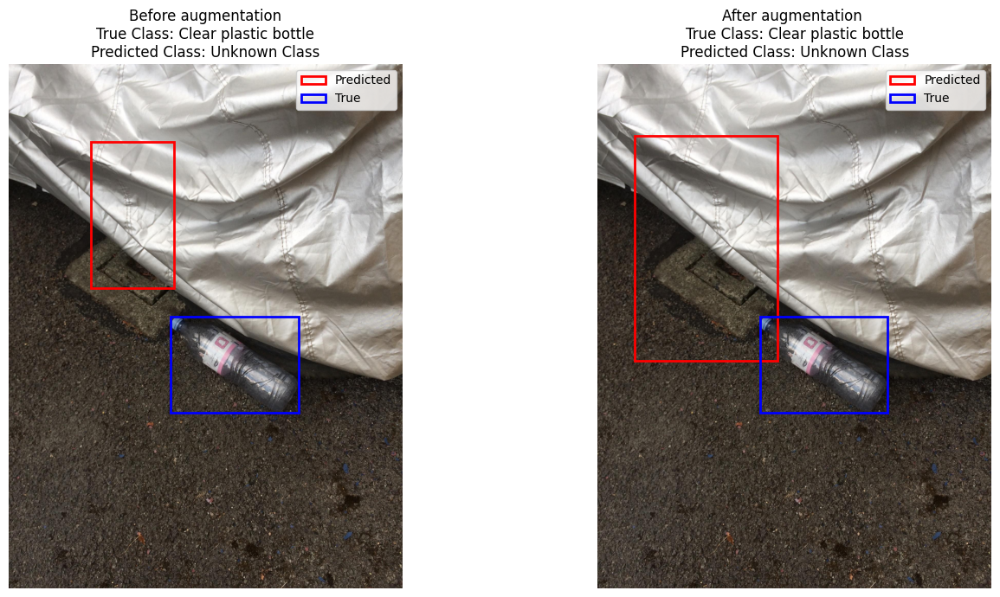

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


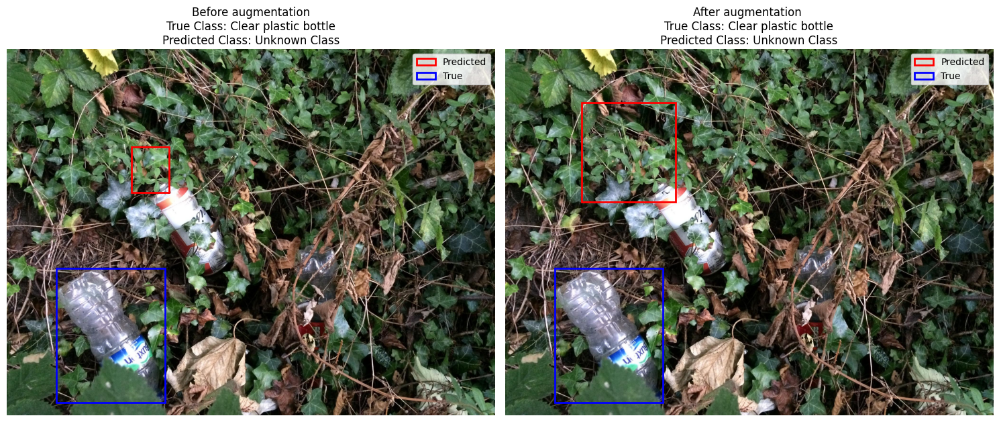

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


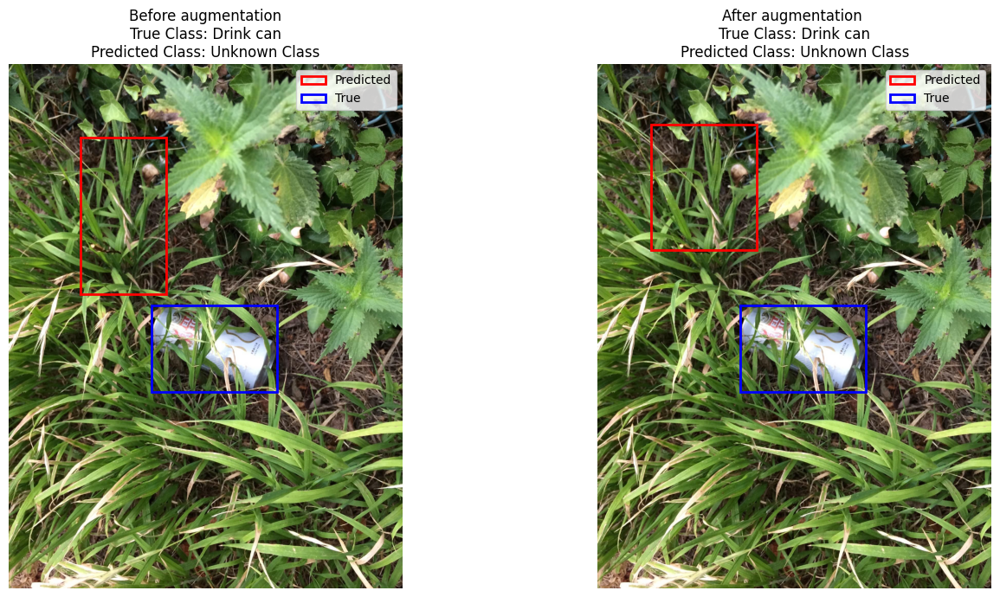

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


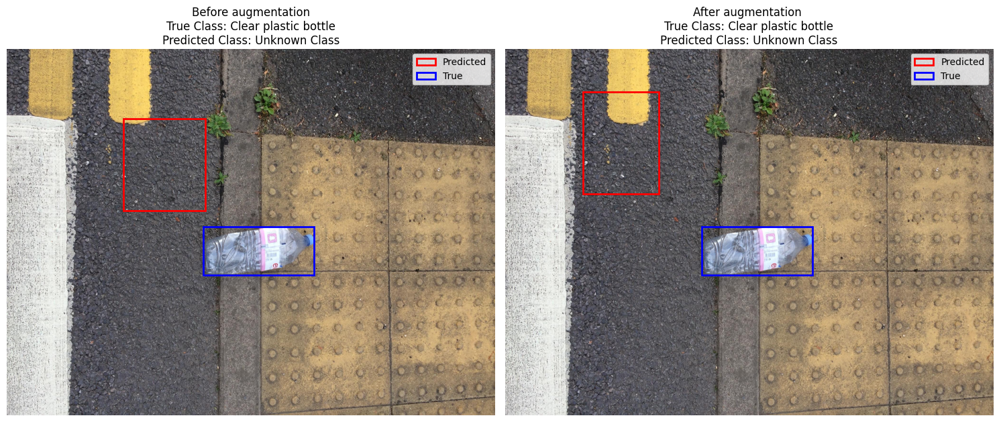

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


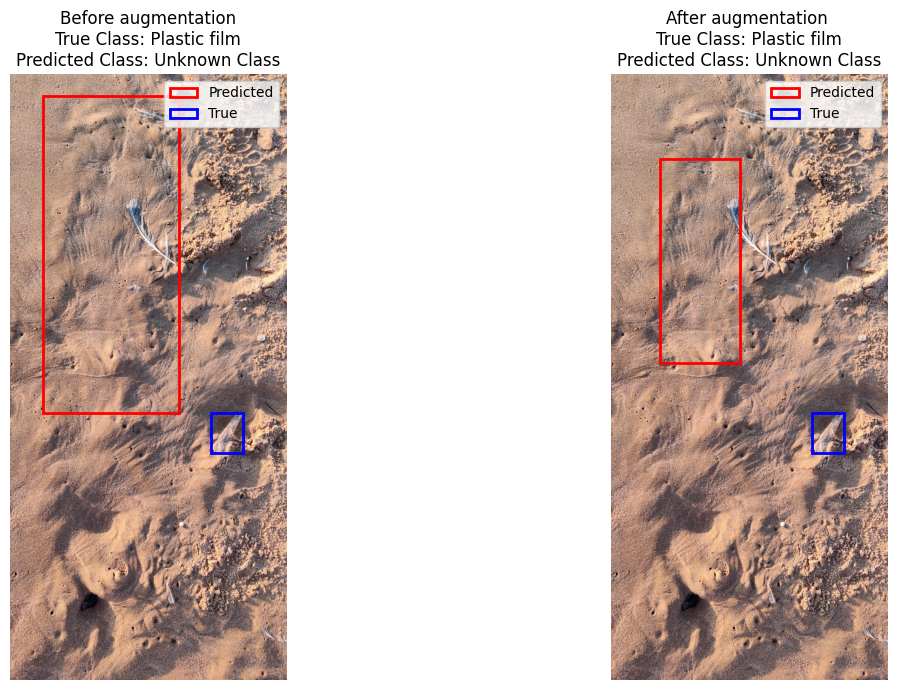

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import json
import os

# List of image filenames to process
image_filenames = [
    'batch_1/000010.jpg',
    'batch_1/000019.jpg',
    'batch_1/000026.jpg',
    'batch_1/000001.jpg',
    'batch_10/000059.jpg'
]
desired_categories = {
    36:  "Plastic film" ,
    5:  "Clear plastic bottle" ,
    12:  "Drink can" ,

}

# Load annotations from the JSON file
with open(os.path.join(data_dir, annotation_file), 'r') as f:
    annotations = json.load(f)

# Iterate through each image in the list
for custom_image_filename in image_filenames:
    # Path to the custom image
    custom_image_path = os.path.join(data_dir, custom_image_filename)

    # Load the custom image
    custom_image = cv2.imread(custom_image_path)
    if custom_image is None:
        raise FileNotFoundError(f"Image not found at {custom_image_path}")

    # Get the original image dimensions
    original_height, original_width = custom_image.shape[:2]

    # Resize the image to the model's expected input size (224x224)
    resized_image = cv2.resize(custom_image, (224, 224))

    # Normalize the resized image
    resized_image_normalized = resized_image / 255.0
    resized_image_normalized = np.expand_dims(resized_image_normalized, axis=0)

    # Run inference for both models
    predictions_1 = model_1.predict(resized_image_normalized)
    predictions_2 = model_2.predict(resized_image_normalized)

    def process_predictions(predictions, model_name):
        if len(predictions.shape) == 2 and predictions.shape[1] == 7:
            pred_bbox = predictions[0][:4]  # First four values are bounding box (normalized)
            pred_class_probs = predictions[0][4:]  # Last values are class probabilities
            pred_class = np.argmax(pred_class_probs)  # Predicted class
        else:
            raise ValueError(f"Unexpected prediction output shape for {model_name}. Expected a shape like (1, 7).")

        # Denormalize the predicted bounding box coordinates
        denormalized_pred_bbox = [
            pred_bbox[0] * original_width,    # x_min
            pred_bbox[1] * original_height,   # y_min
            pred_bbox[2] * original_width,    # width
            pred_bbox[3] * original_height    # height
        ]
        return denormalized_pred_bbox, pred_class

    # Process predictions for both models
    denormalized_pred_bbox_1, pred_class_1 = process_predictions(predictions_1, "Model 1")
    denormalized_pred_bbox_2, pred_class_2 = process_predictions(predictions_2, "Model 2")

    # Find the true annotation for the image
    image_annotation = next((img for img in annotations['images'] if img['file_name'] == custom_image_filename), None)
    if image_annotation is None:
        raise ValueError(f"No annotation found for image {custom_image_filename}")

    image_id = image_annotation['id']
    annotation = next((ann for ann in annotations['annotations'] if ann['image_id'] == image_id), None)
    if annotation is None:
        raise ValueError(f"No bounding box or class found for image {custom_image_filename} in annotations.")

    # True bounding box and class label
    true_bbox = annotation['bbox']  # Format: [x_min, y_min, width, height]
    true_class_index = annotation['category_id']
    denormalized_true_bbox = [true_bbox[0], true_bbox[1], true_bbox[2], true_bbox[3]]
    true_class_label = desired_categories.get(true_class_index, "Unknown Class")

    # Predicted class labels
    predicted_class_label_1 = desired_categories.get(pred_class_1, "Unknown Class")
    predicted_class_label_2 = desired_categories.get(pred_class_2, "Unknown Class")

    # Visualize the results
    fig, axes = plt.subplots(1, 2, figsize=(15, 7))

    for i, (model_name, pred_bbox, pred_class_label, ax) in enumerate([
        ("Before augmentation", denormalized_pred_bbox_1, predicted_class_label_1, axes[0]),
        ("After augmentation ", denormalized_pred_bbox_2, predicted_class_label_2, axes[1])
    ]):
        ax.imshow(cv2.cvtColor(custom_image, cv2.COLOR_BGR2RGB))
        ax.add_patch(plt.Rectangle(
            (pred_bbox[0], pred_bbox[1]),
            pred_bbox[2] - pred_bbox[0],
            pred_bbox[3] - pred_bbox[1],
            fill=False, edgecolor='red', linewidth=2, label="Predicted"
        ))
        ax.add_patch(plt.Rectangle(
            (denormalized_true_bbox[0], denormalized_true_bbox[1]),
            denormalized_true_bbox[2],
            denormalized_true_bbox[3],
            fill=False, edgecolor='blue', linewidth=2, label="True"
        ))
        ax.set_title(f"{model_name}\nTrue Class: {true_class_label}\nPredicted Class: {pred_class_label}")
        ax.axis("off")
        ax.legend(loc="upper right")

    plt.tight_layout()
    plt.show()